In [1]:
import numpy as np
import pandas as pd
import numpy as np

def benchmark(x1, x2):
    return (    (1.3356 * (1.5 * (1 - x1))) 
                + (np.exp((2 * x1) - 1) * np.sin((3 * np.pi) * ((x1 - 0.6) ** 2)))
                + (np.exp(3 * (x2 - 0.5)) * np.sin((4 * np.pi) * ((x2 - 0.9) ** 2)))
            )

# Gera dados aleatórios ao invés de um grid regular
def GetRandomSamples(n_samples):
    x = np.random.uniform(0, 1, n_samples)
    y = np.random.uniform(0, 1, n_samples)
    z = benchmark(x, y)
    return x, y, z

# Cria um DataFrame a partir dos pontos aleatórios
def create_random_dataframe(n_samples):
    x, y, z = GetRandomSamples(n_samples)
    data = {'x1': x, 'x2': y, 'f(x1,x2)': z}
    df = pd.DataFrame(data)
    return df

def GetGrid(grid):
    x = np.linspace(0, 1, grid)
    y = np.linspace(0, 1, grid)
    x, y = np.meshgrid(x, y)
    z = benchmark(x, y)
    return x, y, z

def create_dataframe(grid):
   x, y, z = GetGrid(grid)
   data = {'x1': x.flatten(), 'x2': y.flatten(), 'f(x1,x2)': z.flatten()}
   df = pd.DataFrame(data)
   return df


df_1000 = create_dataframe(32)
df_training = create_random_dataframe(n_samples=30)   
df_test = create_random_dataframe(n_samples=20)       

/tmp/ipykernel_6983/3360514756.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


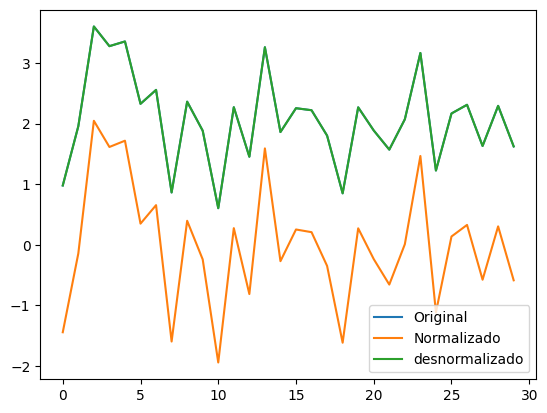

In [2]:
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

scaler = StandardScaler()
out_scaler = StandardScaler()

def test_out_scaler(df):
    out = df["f(x1,x2)"].values.reshape(-1, 1)  
    plt.plot(out, label='Original')
    out_scaler.fit(out)
    norm = out_scaler.transform(out)
    plt.plot(norm, label='Normalizado')
    plt.plot(out_scaler.inverse_transform(norm), label='desnormalizado')
    plt.legend()
    plt.show()

scaler.fit(np.hstack((df_training['x1'].values.reshape(-1, 1),
                       df_training['x2'].values.reshape(-1, 1))))

test_out_scaler(df_training)

In [3]:
import pandas as pd
variograms =  ["Exponential", "Gaussian", "HoleEffect", "Linear", "Original", "Power", "Spherical"]

def SumarizeForNewData():
    df = {"metric": ["r2", "mse", "mape", "rmse"]}
    for variogram in variograms:
        path = f"./{variogram}/results/results.xlsx"
        data = pd.read_excel(path, sheet_name="metrics")
        df[variogram] = data["media"]
    return pd.DataFrame(df)

def SumarizeTrainingMean():
    df = {}
    for variogram in variograms:
        path = f"./{variogram}/results/better_results.xlsx"
        data = pd.read_excel(path)
        data = data.drop(data.columns[-1], axis=1)
        mean_values = data.iloc[:, 2:].mean()
        df[variogram] = mean_values       
    return pd.DataFrame(df)

def SumarizeTraining(sort_by):
    df_dict = {}

    for variogram in variograms:
        path = f"./{variogram}/results/better_results.xlsx"
        data = pd.read_excel(path, index_col=None)
        
        data = data.sort_values(by=sort_by, ascending=True)
        df_dict[variogram] = data.iloc[0]
    
    df = pd.DataFrame(df_dict)
    df = df.iloc[1:]
    return df

def SumarizeForNewDataModel(models):
    df = {"metric": ["r2", "mse", "mape", "rmse"]}
    for variogram, model in zip(variograms, models):
        path = f"./{variogram}/results/results.xlsx"
        data = pd.read_excel(path, sheet_name="metrics")
        df[variogram] = data["media"]
    return pd.DataFrame(df)


# Médias das métricas de treinamento


In [4]:
display(SumarizeTrainingMean())

,Exponential,Gaussian,HoleEffect,Linear,Original,Power,Spherical
r2,0.924570,0.916223,0.917018,0.832296,0.920448,0.908883,0.935372
r2_sup,0.750252,0.379008,0.081580,0.316870,-69.149209,0.599271,0.733669
r2_test,0.655434,-0.390036,0.378637,0.003951,-138.277766,0.451188,0.422471
r2_val,0.910218,0.876266,0.896135,0.767551,0.820639,0.882981,0.913337
mse,0.031871,0.035371,0.033533,0.044665,0.033125,0.033242,0.027952
mse_sup,0.148261,0.368648,0.545214,0.405535,41.643601,0.237890,0.158105
mse_test,0.183347,0.620034,0.594974,0.472654,88.372694,0.123973,0.135523
mse_val,0.037220,0.047956,0.040181,0.057148,0.044277,0.039181,0.034088
mape,0.080183,0.070359,0.080843,0.087943,0.038919,0.081151,0.067273
rmse,0.150589,0.161364,0.157744,0.201229,0.096583,0.163719,0.142419


# Métricas de treinamento para o melhor modelo (ordenado por mse_sup)

In [5]:
df = SumarizeTraining(sort_by="mse_sup")
display(df)

,Exponential,Gaussian,HoleEffect,Linear,Original,Power,Spherical
model,model_1_30_7,model_2_12_7,model_2_21_8,model_2_48_5,model_6_21_7,model_1_47_7,model_2_9_7
r2,0.942374,0.967089,0.953692,0.892954,0.998096,0.894446,0.965786
r2_sup,0.906153,0.907697,0.880261,0.658642,0.974417,0.811201,0.883308
r2_test,0.866905,0.889037,0.915622,0.543344,0.994786,0.614688,0.820063
r2_val,0.929998,0.97918,0.939461,0.789399,0.977246,0.821723,0.95519
mse,0.024349,0.013895,0.018713,0.02851,0.000793,0.038509,0.014798
mse_sup,0.055711,0.054795,0.071082,0.202645,0.015187,0.112079,0.069274
mse_test,0.070821,0.049496,0.080795,0.216697,0.003308,0.08704,0.042224
mse_val,0.028001,0.009704,0.024074,0.028083,0.002925,0.036674,0.015536
mape,0.090162,0.044771,0.075872,0.076725,0.009951,0.100042,0.056886


# Métricas de treinamento para o melhor modelo (ordenado por mse_test)

In [6]:
df = SumarizeTraining(sort_by="mse_test")
display(df)

,Exponential,Gaussian,HoleEffect,Linear,Original,Power,Spherical
model,model_1_27_7,model_2_38_2,model_2_44_6,model_6_29_9,model_6_21_7,model_4_5_9,model_2_9_3
r2,0.940261,0.96384,0.954353,0.882378,0.998096,0.950007,0.965566
r2_sup,0.9003,0.89388,0.873978,0.635815,0.974417,0.659066,0.881547
r2_test,0.875171,0.906433,0.926702,0.59534,0.994786,0.878466,0.82214
r2_val,0.935595,0.936315,0.92955,0.819863,0.977246,0.834849,0.959138
mse,0.025242,0.015267,0.018446,0.031327,0.000793,0.018239,0.014893
mse_sup,0.059186,0.062997,0.074812,0.216196,0.015187,0.202393,0.070319
mse_test,0.066422,0.041736,0.070185,0.192023,0.003308,0.027454,0.041737
mse_val,0.025246,0.030404,0.024621,0.021065,0.002925,0.037498,0.014167
mape,0.091131,0.04988,0.072974,0.077356,0.009951,0.071904,0.057189


In [7]:
import numpy as np
import plotly.offline as py
import plotly.graph_objs as go
import plotly.figure_factory as ff
from scipy.spatial import Delaunay

def PlotSurface(X, Y, Z, model_name, mesh_x=80, mesh_y=100):
    x_sup, y_sup, z_sup = df_1000['x1'], df_1000['x2'], df_1000['f(x1,x2)']
    x_orig, y_orig, z_orig = df_training['x1'], df_training['x2'], df_training['f(x1,x2)']
    x_test, y_test, z_test = df_test['x1'], df_test['x2'], df_test['f(x1,x2)']


    points = np.column_stack((x_sup, y_sup))
    tri = Delaunay(points)

    # Criar a superfície original
    fig_surface = ff.create_trisurf(x=x_sup, y=y_sup, z=z_sup, simplices=tri.simplices, colormap='Greys')

    # Criar a superfície virtual
    virtual_surface = go.Surface(
        x=X.reshape(mesh_x, mesh_y),
        y=Y.reshape(mesh_x, mesh_y),
        z=Z,
        colorscale="matter_r",
        showscale=False,
        contours=dict(
            z=dict(
                show=True,
                start=np.min(Z),
                end=np.max(Z),
                size=0.05,
                usecolormap=True,
                project_z=True
            )
        )
    )
    fig = go.Figure()

    fig.add_trace(go.Scatter3d(x=x_orig, y=y_orig, z=z_orig, mode='markers',
                               marker=dict(size=5, color='red', opacity=0.8),
                               name='Training Samples', showlegend = True))
    
    fig.add_trace(go.Scatter3d(x=x_test, y=y_test, z=z_test,
                               mode='markers',
                               marker=dict(size=5, color='blue', opacity=0.8),
                               name='Test Samples', showlegend = True))

    fig.add_trace(fig_surface.data[0])

    fig.add_trace(virtual_surface)
    fig.update_layout(
        title=f'Surface fit for {model_name} variogram',
        scene=dict(
            xaxis_title='x1',
            yaxis_title='x2',
            zaxis_title='f(x1, x2)',
            aspectmode='cube',
            xaxis = dict(backgroundcolor = "white"),
            yaxis = dict(backgroundcolor = "white"),
            zaxis = dict(backgroundcolor = "white"),
        )
    )
    py.iplot(fig)

In [8]:
import os

os.chdir("./content")

lm_dir = "tf-levenberg-marquardt"
if not os.path.exists(lm_dir):
  !git clone https://github.com/fabiodimarco/$lm_dir

os.chdir(lm_dir)

In [9]:
import tensorflow as tf
import numpy as np
from keras import regularizers
from keras import initializers
import levenberg_marquardt as lm

# layers, neurons
class ShuffleArchitecture:
    def __init__(self, input_size, hidden_sizes, output_size, act_h, act_o, param_reg):
        self.input_size = input_size
        self.hidden_sizes = hidden_sizes
        self.output_size = output_size
        self.act_h = act_h
        self.act_o = act_o
        self.regularizer = regularizers.L2(param_reg)
        self.initializer = initializers.RandomUniform(minval=-0.5, maxval=0.5, seed=np.random.randint(1, 10000))

    def compute_k(self):
        total_parameters = 0
        for layer in self.model.layers:
            weights = layer.get_weights()
            if len(weights) > 0:  
                for w in weights:
                    total_parameters += np.prod(w.shape)
        return total_parameters
        
    def set_architecture(self):
        self.model = tf.keras.Sequential()
        self.model.add(tf.keras.layers.Dense(self.hidden_sizes[0],
                        input_shape=(self.input_size,),
                        activation=self.act_h,
                        kernel_regularizer=self.regularizer,
                        kernel_initializer=self.initializer,                        
                        ))  # input layer

        for size in self.hidden_sizes[1:]:  # hidden layers
            self.model.add(tf.keras.layers.Dense(size,
                            activation=self.act_h,
                            kernel_regularizer=self.regularizer,
                            kernel_initializer=self.initializer,  
                        ))

        self.model.add(tf.keras.layers.Dense(self.output_size,
                        activation=self.act_o,
                        kernel_regularizer=self.regularizer,
                        kernel_initializer=self.initializer,  
                        ))  # output layer

    def create_model(self, _learning_rate):
        self.model.compile(
            optimizer=tf.keras.optimizers.Adam(learning_rate=_learning_rate),
            loss=tf.keras.losses.MeanSquaredError())

        self.lm_model = lm.ModelWrapper(
            tf.keras.models.clone_model(self.model))

        self.lm_model.compile(
            optimizer=tf.keras.optimizers.SGD(learning_rate=_learning_rate),
            loss=lm.MeanSquaredError())
        return(self.lm_model)

2024-10-14 17:49:05.719660: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-10-14 17:49:05.719766: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-10-14 17:49:06.027585: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-10-14 17:49:06.623066: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-10-14 17:49:09.933469: W tensorflow/compiler/tf2

In [10]:
import pickle
import numpy as np

class Rebuild:
    def __init__(self, df):
        self.df = df 

    def LoadModelWeights(self, model, fileName):        
        file = f"{self.path}/models/{fileName}.keras"
        model.load_weights(file)

    def LoadPrevDataset(self, fileName):
        fileName = fileName.replace("model", "dataset")
        pos = fileName.rfind("_")
        file = f"{self.path}/dataset/{fileName[:pos]}.pkl" 
        with open(file, 'rb') as f:
            _data, _train, _val, _test = pickle.load(f)
        self._data, self._train, self._val, self._test = _data, _train, _val, _test    
    
    def setArchitecture(self, _hidden_sizes, _pg, _lr):
        shuffler = ShuffleArchitecture(input_size  = 2,
                                        hidden_sizes = _hidden_sizes,
                                        output_size = 1,
                                        act_h = 'tanh',
                                        act_o = 'linear',
                                        param_reg=_pg)
        shuffler.set_architecture()
        self.k = shuffler.compute_k()
        return(shuffler.create_model(_lr))            

    def getArchitecture(self, architecture):
        hidden_size = [int(x) for x in architecture.split("[")[1].split("]")[0].split(", ")]
        regularizer = float(architecture.split("regularizer=")[1].split(",")[0])
        learning_rate = float(architecture.split("learning_rate=")[1])
        return hidden_size, regularizer, learning_rate   
    
    def predictUnsampled(self, model, mesh_x=80, mesh_y=100):
        Z = np.zeros((mesh_x, mesh_y))
        dx, dy = 1 / mesh_y, 1 / mesh_x

        X = np.zeros(mesh_x * mesh_y)
        Y = np.zeros(mesh_x * mesh_y)
        
        points = np.zeros((mesh_x * mesh_y, 2))
        
        for i in range(mesh_x):
            for j in range(mesh_y):
                idx = i * mesh_y + j
                X[idx] = dx * j
                Y[idx] = dy * i
                points[idx] = [X[idx], Y[idx]]

        points = scaler.transform(points)
        Z_flat = model.predict(points)
        Z_flat = out_scaler.inverse_transform(Z_flat)

        Z = Z_flat.reshape((mesh_x, mesh_y))

        return X, Y, Z

    def rebuildFullNet(self):
        for file_model, architecture, variogram in zip(self.df["model"], self.df["Architecture"], self.df.index):
            print(file_model, architecture, variogram)
            self.path = f'../../{variogram}/content'
            hidden_size, regularizer, learning_rate = self.getArchitecture(architecture)
            self.lm_model = self.setArchitecture(hidden_size, regularizer, learning_rate)
            self.LoadModelWeights(self.lm_model, file_model)
            self.LoadPrevDataset(file_model)
            X, Y, Z = self.predictUnsampled(self.lm_model)
            PlotSurface(X, Y, Z, variogram)

In [11]:
Rebuilder = Rebuild(df.T)
Rebuilder.rebuildFullNet()

model_1_27_7 Hidden Size=[4], regularizer=0.02, learning_rate=0.01 Exponential
250/250 [==============================] - 1s 2ms/step


model_2_38_2 Hidden Size=[8], regularizer=0.02, learning_rate=0.01 Gaussian
250/250 [==============================] - 1s 2ms/step


model_2_44_6 Hidden Size=[8], regularizer=0.02, learning_rate=0.01 HoleEffect
250/250 [==============================] - 0s 2ms/step


model_6_29_9 Hidden Size=[4, 2], regularizer=0.02, learning_rate=0.01 Linear
250/250 [==============================] - 1s 2ms/step


model_6_21_7 Hidden Size=[4, 2], regularizer=0.02, learning_rate=0.01 Original
250/250 [==============================] - 1s 3ms/step


model_4_5_9 Hidden Size=[24], regularizer=0.02, learning_rate=0.01 Power
250/250 [==============================] - 1s 2ms/step


model_2_9_3 Hidden Size=[8], regularizer=0.02, learning_rate=0.01 Spherical
250/250 [==============================] - 0s 2ms/step
